<a href="https://colab.research.google.com/github/mydevco/python-desktop-reference/blob/main/PySwarmOptimization_Visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#PySwarm Optimization

Swarm intelligence is a computational approach that solves complex problems by mimicking the decentralized, self-organized behavior observed in natural swarms like flocks of birds or ant colonies.

The pyswarm package is a gradient-free, evolutionary optimization package for python that supports constraints. We will import pyswarm library and implement a classifier using PSO. Particle swarm optimization offers a powerful, nature-inspired approach to solving tough optimization problems. With PySwarm, you can quickly apply PSO in Python for a wide range of applications — from academic research to practical business problems.

PySwarms is a python based tool that helps with swarm optimisation. Researchers, practitioners, and students alike use this tool in order to apply the PSO algorithm using a high-level interface. PySwarms is the best tool to integrate swarm optimisation with basic optimization. So, thiis tool allows you to implement and use a number of many-particle swarm optimisation techniques. It's also extremely user-friendly and adaptable to different projects.



For more details on PySwarm please refer https://pyswarms.readthedocs.io/en/latest/

In [ ]:
#Install pyswarm
!!pip install pyswarms

['Collecting pyswarms',
 '  Downloading pyswarms-1.3.0-py2.py3-none-any.whl.metadata (33 kB)',
 'Requirement already satisfied: scipy in /usr/local/lib/python3.12/dist-packages (from pyswarms) (1.16.2)',
 'Requirement already satisfied: numpy in /usr/local/lib/python3.12/dist-packages (from pyswarms) (2.0.2)',
 'Requirement already satisfied: matplotlib>=1.3.1 in /usr/local/lib/python3.12/dist-packages (from pyswarms) (3.10.0)',
 'Requirement already satisfied: attrs in /usr/local/lib/python3.12/dist-packages (from pyswarms) (25.3.0)',
 'Requirement already satisfied: tqdm in /usr/local/lib/python3.12/dist-packages (from pyswarms) (4.67.1)',
 'Requirement already satisfied: future in /usr/local/lib/python3.12/dist-packages (from pyswarms) (1.0.0)',
 'Requirement already satisfied: pyyaml in /usr/local/lib/python3.12/dist-packages (from pyswarms) (6.0.2)',
 'Requirement already satisfied: contourpy>=1.0.1 in /usr/local/lib/python3.12/dist-packages (from matplotlib>=1.3.1->pyswarms) (1.3

##Implement a classifier with enhanced feature selection performance using PSO

We will be using the optimizer pyswarms.discrete.BinaryPSO.
For more details on Binary PSO please refer  to https://pyswarms.readthedocs.io/en/latest/api/pyswarms.discrete.html

In [ ]:
# Import modules
#Numpy for numeric processing
import numpy as np

#Seaborn is used for plotting along with matplotlib
import seaborn as sns

#Import panda for dataframes data processing
import pandas as pd

# Import PySwarms
import pyswarms as ps

#Import sklearn to create sample data
from sklearn.datasets import make_classification

#Generate a 100-sample, 15-dimensional dataset with three classes
X, y = make_classification(n_samples=100, n_features=15, n_classes=3,
                           n_informative=4, n_redundant=1, n_repeated=2,
                           random_state=1)

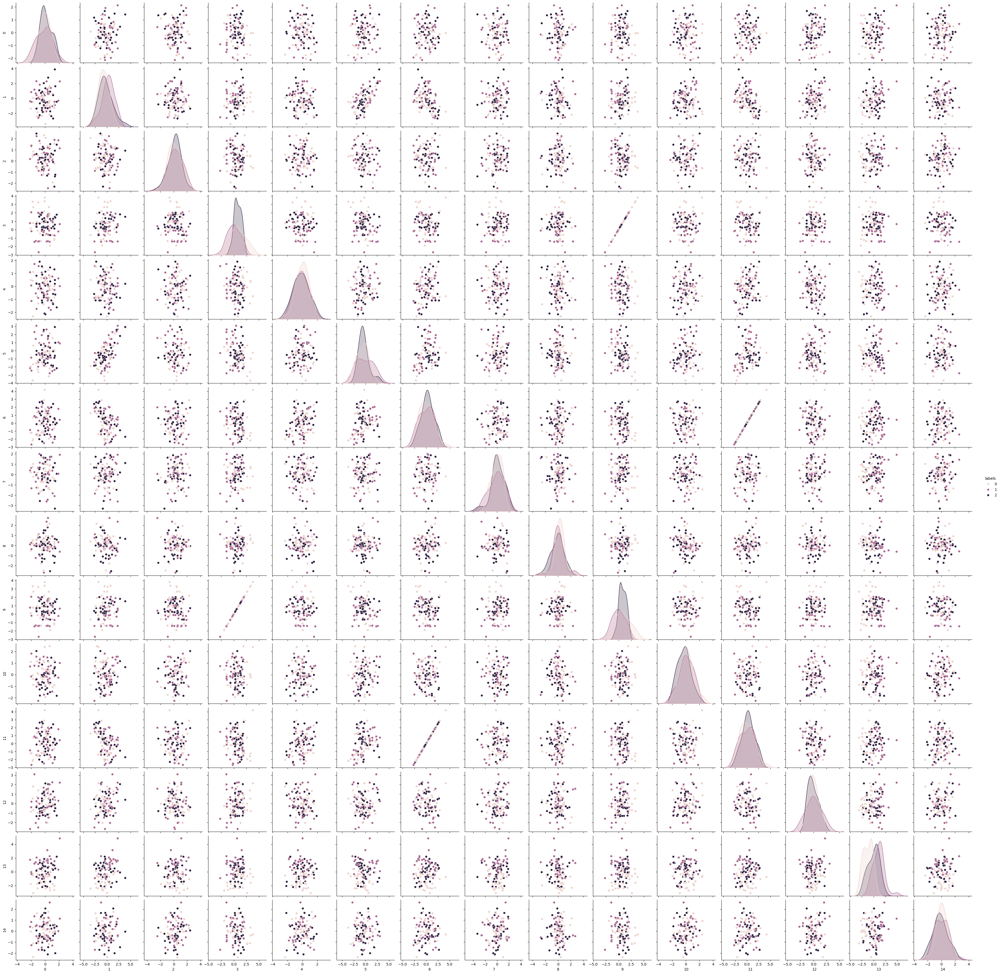

In [ ]:
# Plot dataset per feature using panda and seaborn
df = pd.DataFrame(X)
df['labels'] = pd.Series(y)

sns.pairplot(df, hue='labels');

We will then use a simple logistic regression technique using sklearn.linear_model.LogisticRegression to perform classification. A simple test of accuracy will be used to assess the performance of the classifier.


Pyswarm needs an objective function to optimize. Ourt objective function is the performance of the classifier (accuracy), and the size of the feature subset divided by the total (that is, divided by 10), to return an error in the data

In [ ]:
#Import sklearn linear model
from sklearn import linear_model

# Create an instance of the classifier
classifier = linear_model.LogisticRegression()

# Define objective function
def f_per_particle(m, alpha):
    """Computes for the objective function per particle

    Inputs
    ------
    m : numpy.ndarray
        Binary mask that can be obtained from BinaryPSO, will
        be used to mask features.
    alpha: float (default is 0.5)
        Constant weight for trading-off classifier performance
        and number of features

    Returns
    -------
    numpy.ndarray
        Computed objective function
    """
    total_features = 15
    # Get the subset of the features from the binary mask
    if np.count_nonzero(m) == 0:
        X_subset = X
    else:
        X_subset = X[:,m==1]

    # Perform classification and store performance in P
    classifier.fit(X_subset, y)
    P = (classifier.predict(X_subset) == y).mean()

    # Compute for the objective function
    j = (alpha * (1.0 - P)
        + (1.0 - alpha) * (1 - (X_subset.shape[1] / total_features)))

    return j

def f(x, alpha=0.88):
    """Higher-level method to do classification in the
    whole swarm.

    Inputs
    ------
    x: numpy.ndarray of shape (n_particles, dimensions)
        The swarm that will perform the search

    Returns
    -------
    numpy.ndarray of shape (n_particles, )
        The computed loss for each particle
    """
    n_particles = x.shape[0]
    j = [f_per_particle(x[i], alpha) for i in range(n_particles)]
    return np.array(j)

In [ ]:
# Initialize swarm using arbitrary parameters
options = {'c1': 0.5, 'c2': 0.5, 'w':0.9, 'k': 30, 'p':2}

# Call instance of PSO
dimensions = 15 # dimensions should be the number of features

optimizer = ps.discrete.BinaryPSO(n_particles=30, dimensions=dimensions, options=options)

# Perform optimization
cost, pos = optimizer.optimize(f, iters=1000, verbose=True)

2025-09-28 22:07:55,102 - pyswarms.discrete.binary - INFO - Optimize for 1000 iters with {'c1': 0.5, 'c2': 0.5, 'w': 0.9, 'k': 30, 'p': 2}
pyswarms.discrete.binary: 100%|██████████|1000/1000, best_cost=0.193
2025-09-28 22:11:25,136 - pyswarms.discrete.binary - INFO - Optimization finished | best cost: 0.19279999999999997, best pos: [1 1 1 1 1 1 1 1 1 1 0 1 1 1 1]


In [ ]:
# Print the results
print("Best position:", pos)
print("Best cost:", cost)

Best position: [1 1 1 1 1 1 1 1 1 1 0 1 1 1 1]
Best cost: 0.19279999999999997


In [ ]:
#Run another instance logistic regression and use the feature subsets suggested by PSO

# Create another instances of LogisticRegression
classifier1 = linear_model.LogisticRegression()

# Get the selected features from the final positions
X_selected_features = X[:,pos==1]  # subset

# Perform classification and store performance in P
classifier1.fit(X_selected_features, y)

# Compute performance
subset_performance = (classifier1.predict(X_selected_features) == y).mean()


print('Accuracy score using optimized feature subset: %.3f' % (subset_performance))

Accuracy score using optimized feature subset: 0.790


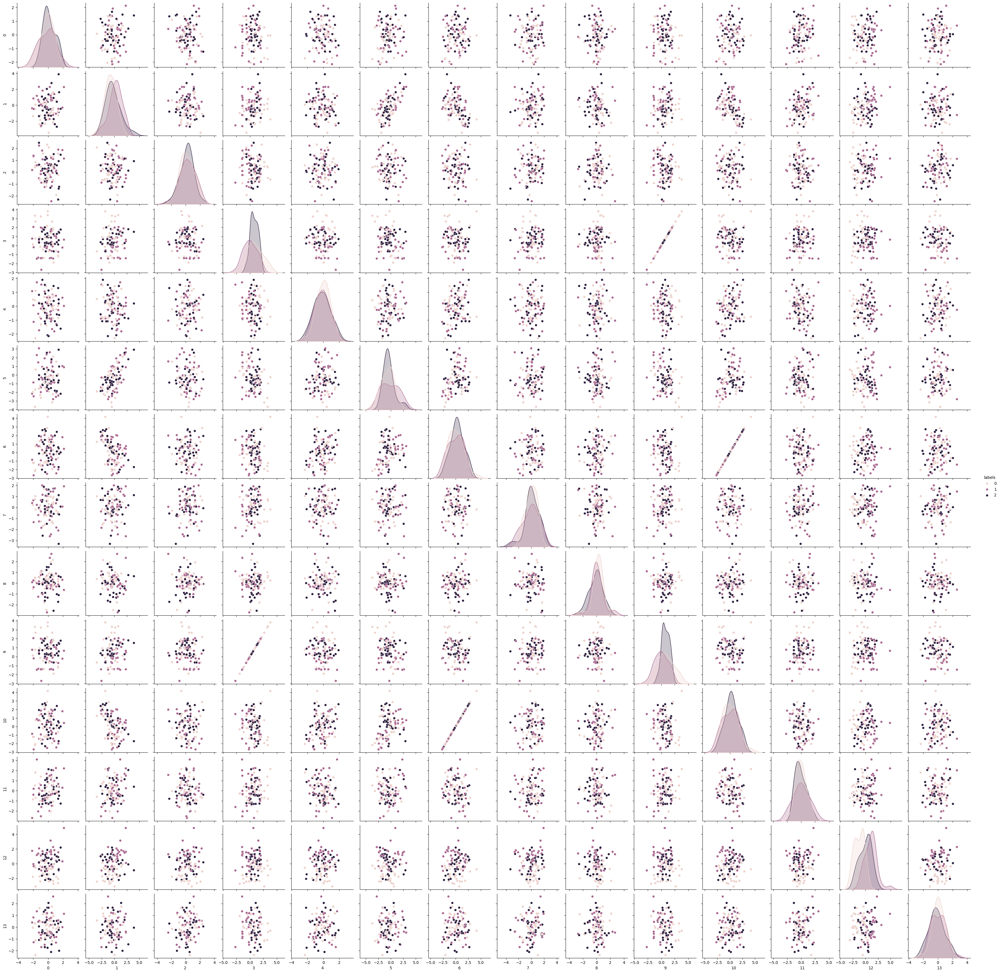

In [ ]:
# Plot dataset per feature subset
df1 = pd.DataFrame(X_selected_features)
df1['labels'] = pd.Series(y)

sns.pairplot(df1, hue='labels')



---



### PSO using test function pyswarms.utils.functions.single_obj.sphere

In [ ]:
#Import Pyswarm, numpy and matplotlib and other modules
import numpy as np
import pyswarms as ps

#The mod:pyswarms.utils.functions module implements various test functions for optimization.
# single_obj contains collection of single-objective functions
from pyswarms.utils.functions import single_obj as fx
import matplotlib.pyplot as plt

#Pyswarm also has various plotting helper libraries
from pyswarms.utils.plotters.formatters import Designer
from pyswarms.utils.plotters.formatters import Mesher
from pyswarms.utils.plotters import plot_contour, plot_surface
#To calculate run time of functions
import time

In [ ]:
# Set-up all the hyperparameters
options = {'c1': 0.5, 'c2': 0.3, 'w':0.9}

# get a two domention optimizer instance by calling pyswarm
# The pyswarms.single module implements various techniques in continuous single-objective optimization.
#These require only one objective function that can be optimized in a continuous space.
optimizer = ps.single.GlobalBestPSO(n_particles=10, dimensions=2, options=options)

start_time = time.time() # get start time

# Perform the optimization
#Use Sphere objective function from single_obj collection
cost, pos = optimizer.optimize(fx.sphere, iters=1000)

print("===============================================================")
print(f"Optimization completed in {time.time() - start_time}")
print(f" Best Cost = {cost}")
print(f" Best Position = {pos}")

2025-09-28 22:46:15,118 - pyswarms.single.global_best - INFO - Optimize for 1000 iters with {'c1': 0.5, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|1000/1000, best_cost=1.78e-44
2025-09-28 22:46:16,407 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 1.781344820167014e-44, best pos: [-4.01110794e-23 -1.27297092e-22]


Optimization completed in 1.291933536529541
 Best Cost = 1.781344820167014e-44
 Best Position = [-4.01110794e-23 -1.27297092e-22]


##Visulaize the Position history function as 2D plot


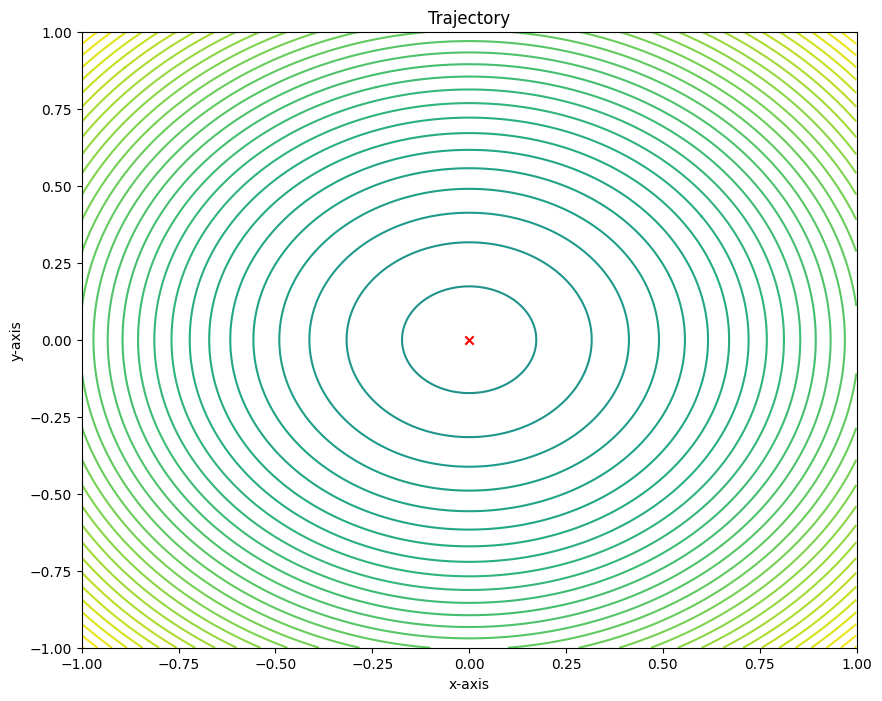

In [ ]:
#Format shere objective function using Mesher from Pyswarm formmating package
m = Mesher(func=fx.sphere)

# Get the 2D plot from pyswarm plotter plot contour
animation = plot_contour(pos_history=optimizer.pos_history,
                         mesher=m,
                         mark=(0,0))
#Show the plot
# Make our plots bigger.
plt.rcParams['figure.figsize'] = (5, 6)
plt.show()

## Visulaize the cost history function in 2D

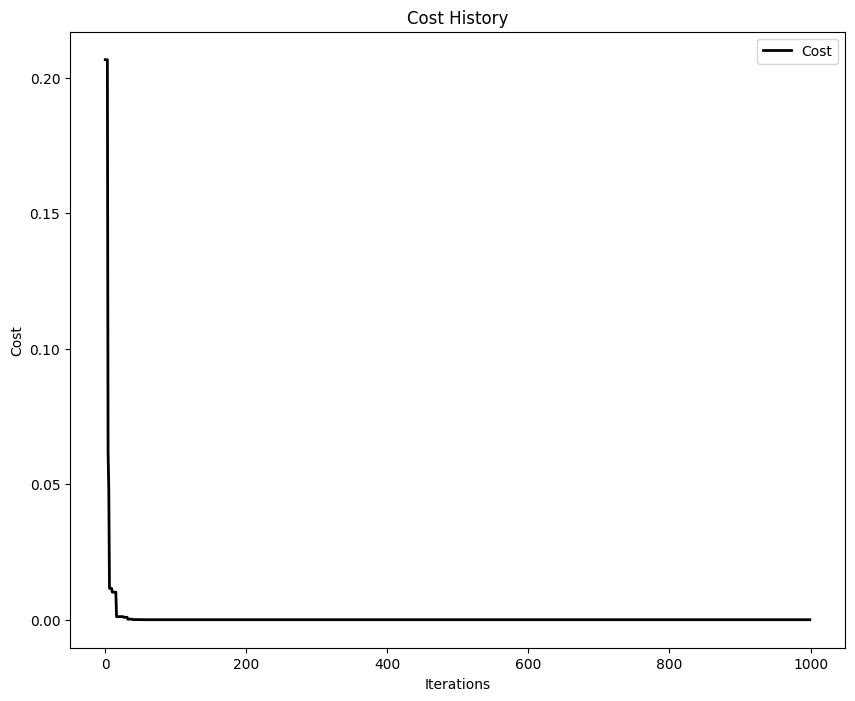

In [ ]:
#Import cost history plotter
from pyswarms.utils.plotters import plot_cost_history
import matplotlib.pyplot as plt

# Obtain cost history from optimizer instance
cost_history = optimizer.cost_history

#Create plotter for cost history
plot_cost_history(cost_history)

#Show the plot
plt.show()

2025-09-28 21:49:19,218 - matplotlib.animation - INFO - Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
2025-09-28 21:49:19,219 - matplotlib.animation - INFO - MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1000x800 -pix_fmt rgba -framerate 12.5 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmpf_jad7m3/temp.m4v


'<video width="1000" height="800" controls autoplay loop>\n  <source type="video/mp4" src="data:video/mp4;base64,AAAAIGZ0eXBNNFYgAAACAE00ViBpc29taXNvMmF2YzEAAAAIZnJlZQALmJ9tZGF0AAACrgYF//+q\n3EXpvebZSLeWLNgg2SPu73gyNjQgLSBjb3JlIDE2MyByMzA2MCA1ZGI2YWE2IC0gSC4yNjQvTVBF\nRy00IEFWQyBjb2RlYyAtIENvcHlsZWZ0IDIwMDMtMjAyMSAtIGh0dHA6Ly93d3cudmlkZW9sYW4u\nb3JnL3gyNjQuaHRtbCAtIG9wdGlvbnM6IGNhYmFjPTEgcmVmPTMgZGVibG9jaz0xOjA6MCBhbmFs\neXNlPTB4MzoweDExMyBtZT1oZXggc3VibWU9NyBwc3k9MSBwc3lfcmQ9MS4wMDowLjAwIG1peGVk\nX3JlZj0xIG1lX3JhbmdlPTE2IGNocm9tYV9tZT0xIHRyZWxsaXM9MSA4eDhkY3Q9MSBjcW09MCBk\nZWFkem9uZT0yMSwxMSBmYXN0X3Bza2lwPTEgY2hyb21hX3FwX29mZnNldD0tMiB0aHJlYWRzPTMg\nbG9va2FoZWFkX3RocmVhZHM9MSBzbGljZWRfdGhyZWFkcz0wIG5yPTAgZGVjaW1hdGU9MSBpbnRl\ncmxhY2VkPTAgYmx1cmF5X2NvbXBhdD0wIGNvbnN0cmFpbmVkX2ludHJhPTAgYmZyYW1lcz0zIGJf\ncHlyYW1pZD0yIGJfYWRhcHQ9MSBiX2JpYXM9MCBkaXJlY3Q9MSB3ZWlnaHRiPTEgb3Blbl9nb3A9\nMCB3ZWlnaHRwPTIga2V5aW50PTI1MCBrZXlpbnRfbWluPTEyIHNjZW5lY3V0PTQwIGludHJhX3Jl\nZnJlc2g9MCByY19sb29rYWhlYWQ9N

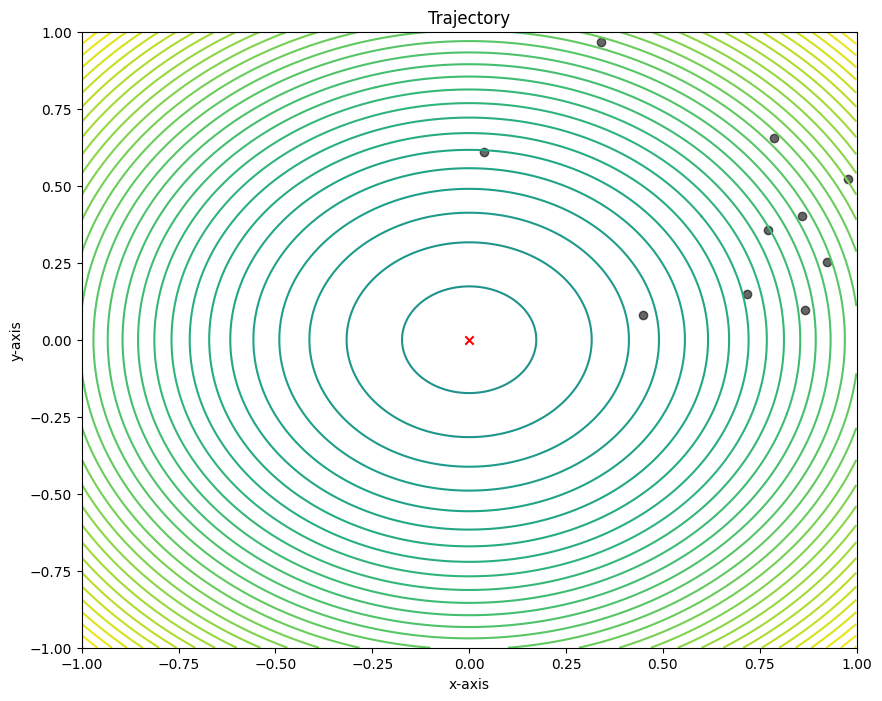

In [ ]:
# Make animation
animation = plot_contour(pos_history=optimizer.pos_history,
                         mesher=m,
                         mark=(0,0))

# Enables us to view it in a Jupyter notebook
animation.to_html5_video()